-----------------------------------------------------------------------------------------------------------------------
# **Predicting Patients' No-Show**
-----------------------------------------------------------------------------------------------------------------------

--------------------
## **Context**
--------------------

This project aims to build a model to predict patients' commitment to appointments and understand the underlying reasons behind patients' No-Show appointments. The dataset used to create the model is survey data (63 questions) collected by Ipsos Public Affairs between July and August 2020. The target population consisted of non-institutionalized adults aged 18 and older residing in the United States, with oversamples of African Americans, Hispanics, and adults in low-income households. 

Understanding what influences patients' appointments commitment can result in significant improvements, including: 
1. Resource optimization: When patients do not show up for their scheduled appointments, it underutilizes healthcare resources, such as doctors, nurses, and other support staff, as well as equipment and facilities. By predicting which patients are likely to no-show, healthcare providers can optimize their resources by scheduling appointments for patients who are more likely to show up.

2. Cost reduction: No-shows can result in high costs for healthcare providers. When appointments are not utilized, it leads to lost revenue and wasted resources. Predicting no-shows can help healthcare providers reduce costs by reallocating resources and filling appointment slots that would otherwise go unused.

3. Improved patient outcomes: No-shows can negatively impact patient outcomes, as missed appointments can lead to delayed diagnosis, treatment, and follow-up care. By predicting which patients are likely to no-show, healthcare providers can proactively reach out to patients and encourage them to attend their appointments, thereby improving patient outcomes.

4. Better patient experience: No-shows can frustrate patients and healthcare providers. Patients may become frustrated if they cannot get an appointment when needed, while healthcare providers may become frustrated if they have empty appointment slots. Healthcare providers can improve the patient experience and build trust with their patients by predicting no-shows and taking proactive measures to reduce them.


**Note:** the cleaning process was done seperatly using R.

## **Importing the libraries and overview of the dataset**

In [1]:
# load the libraries
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

# For corss validation
from sklearn.model_selection import cross_val_score

# Algorithms to use
from sklearn import tree

from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier

# Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report,recall_score,precision_score, accuracy_score

# For tuning the model
from sklearn.model_selection import GridSearchCV

# To plot the tree
from sklearn.tree import plot_tree

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# load the data
df= pd.read_spss("./Data/df_pos_without.sav")

In [3]:
#data type for each column
df.dtypes

duration      float64
DeviceType    float64
weight        float64
xspanish      float64
xacslang      float64
               ...   
Q49bin        float64
Q53bin        float64
Q55bin        float64
Q59bin        float64
ppgndrbin     float64
Length: 158, dtype: object

In [4]:
# checking the first 5 rows
df.head()

,duration,DeviceType,weight,xspanish,xacslang,pphispan,xcom,xfpl100,xzip,Q1,...,Q5bin,Q10bin,Q15bin,Q18bin,Q43bin,Q49bin,Q53bin,Q55bin,Q59bin,ppgndrbin
0,59.33,3.0,1.8664,1.0,5.0,1.0,1.0,2.0,95357.0,3.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
1,32.10,3.0,1.7386,1.0,5.0,1.0,1.0,2.0,77581.0,3.0,...,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0
2,313.84,10.0,0.3701,1.0,5.0,1.0,2.0,2.0,30291.0,3.0,...,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,14.96,10.0,2.1849,1.0,5.0,1.0,1.0,2.0,60160.0,3.0,...,1.0,2.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
4,24.40,4.0,0.4288,1.0,1.0,8.0,3.0,2.0,77077.0,2.0,...,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0


In [5]:
#checking the dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Columns: 158 entries, duration to ppgndrbin
dtypes: float64(158)
memory usage: 709.9 KB


In [6]:
#checking the number of unique values in each column
df.nunique()

duration      541
DeviceType      9
weight        480
xspanish        2
xacslang        4
             ... 
Q49bin          2
Q53bin          2
Q55bin          3
Q59bin          2
ppgndrbin       2
Length: 158, dtype: int64

**Note** There are no features that are entirly unique.

## **Exploratory Data Analysis and Data Preprocessing** 

### **Univariate analysis of numerical columns**

In [7]:
# Checking summary statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration,575.0,57.514383,227.411580,6.1700,19.8650,26.8500,38.62000,3955.6900
DeviceType,575.0,7.133913,3.071928,1.0000,4.0000,8.0000,10.00000,15.0000
weight,575.0,1.031733,0.875325,0.1646,0.3785,0.6941,1.48915,4.5551
xspanish,575.0,1.060870,0.239299,1.0000,1.0000,1.0000,1.00000,2.0000
xacslang,575.0,4.273043,1.348720,1.0000,5.0000,5.0000,5.00000,5.0000
...,...,...,...,...,...,...,...,...
Q49bin,575.0,0.860870,0.346384,0.0000,1.0000,1.0000,1.00000,1.0000
Q53bin,575.0,0.902609,0.296748,0.0000,1.0000,1.0000,1.00000,1.0000
Q55bin,575.0,1.036522,0.409455,0.0000,1.0000,1.0000,1.00000,2.0000
Q59bin,575.0,0.245217,0.430591,0.0000,0.0000,0.0000,0.00000,1.0000


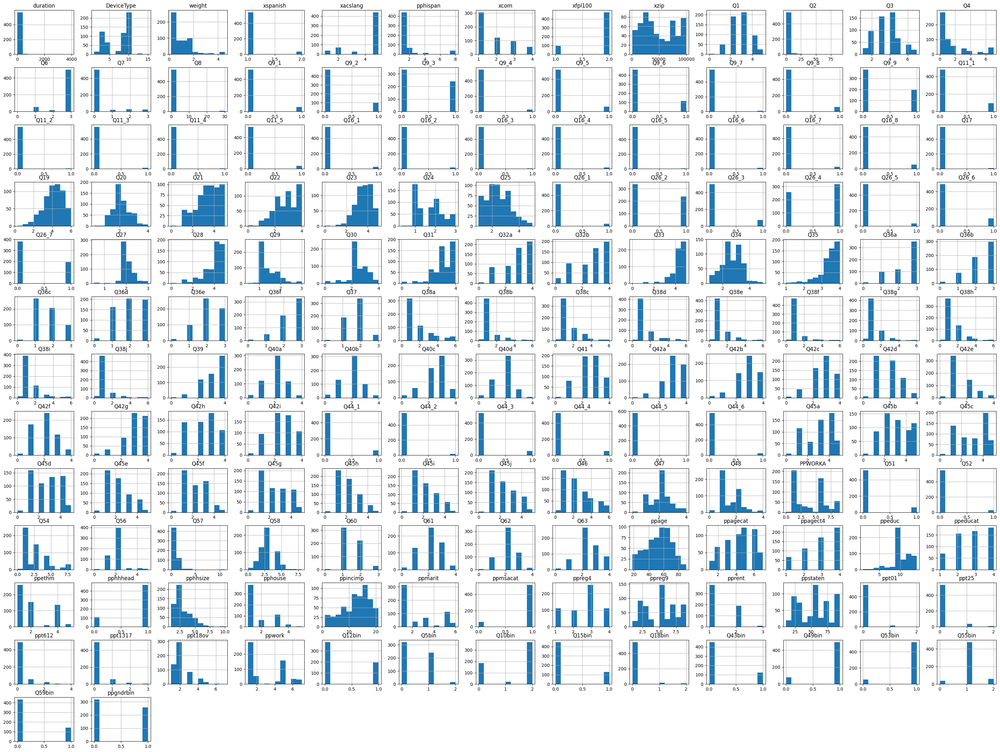

In [8]:
# Creating histograms
df.hist(figsize = (40,30))

plt.show()

<Axes: >

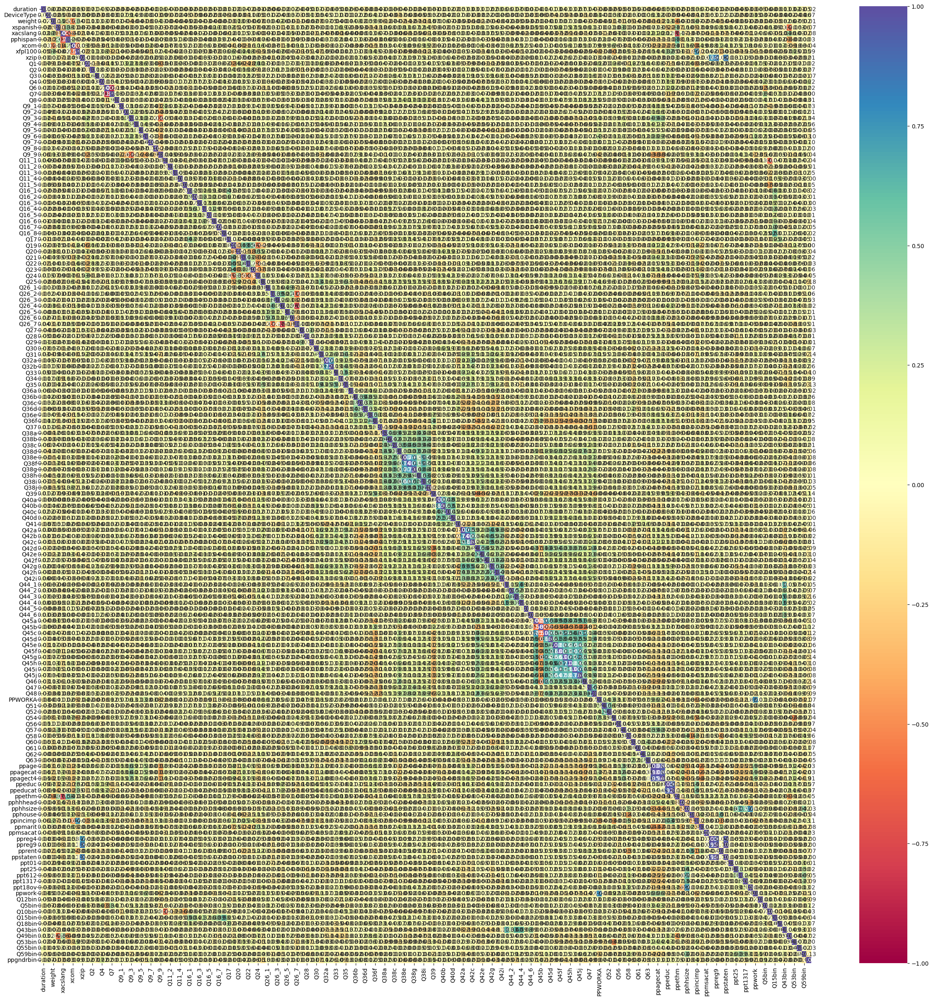

In [9]:

plt.figure(figsize = (30, 30))

sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1, fmt = ".2f", cmap = "Spectral")

In [8]:
# Printing the % sub categories of each category.
for i in df.columns:
    
    print(df[i].value_counts(normalize = True))
    
    print('*' * 40)

19.37    0.005217
20.77    0.005217
30.04    0.003478
27.81    0.003478
33.14    0.003478
           ...   
32.99    0.001739
32.36    0.001739
50.41    0.001739
92.41    0.001739
30.26    0.001739
Name: duration, Length: 541, dtype: float64
****************************************
10.0    0.401739
3.0     0.215652
8.0     0.203478
4.0     0.095652
7.0     0.033043
1.0     0.024348
5.0     0.017391
13.0    0.006957
15.0    0.001739
Name: DeviceType, dtype: float64
****************************************
0.2618    0.008696
4.5551    0.008696
0.3066    0.006957
1.3382    0.006957
1.8822    0.006957
            ...   
0.4804    0.001739
1.8373    0.001739
0.2509    0.001739
1.4190    0.001739
0.3295    0.001739
Name: weight, Length: 480, dtype: float64
****************************************
1.0    0.93913
2.0    0.06087
Name: xspanish, dtype: float64
****************************************
5.0    0.763478
2.0    0.125217
1.0    0.064348
3.0    0.046957
Name: xacslang, dtype: float64
*

## **Model Building - Approach**

1. Partition the data into a train and test set.
2. Build a model on the train data.
3. Tune the model if required.
4. Test the data on the test set.

### **Partition the data into train and test**
This step will include seperating the data into:
1. the columns of data that we will use to make classification
2. the columns of data that we want to predict 

we will seperate the independent variables (X) and the dependent variable (Y)

In [9]:
# Separating the target variable and other variables

Y = df.Q12bin

X = df.drop(['Q12bin'], axis = 1)

### **One-Hot-Encoding**
One-hot encoding is a technique used to convert categorical variables into a format that can be used for machine learning models. In one-hot encoding, each categorical variable is represented as a binary vector, with each possible category represented by a single vector dimension. The dimension corresponding to the category is set to 1, and all other dimensions are set to 0.

For example, if we have a categorical variable "color" with three possible categories: red, blue, and green, we would represent it using one-hot encoding as follows:

red -> [1, 0, 0]<br>
blue -> [0, 1, 0]<br>
green -> [0, 0, 1]

Without one-hot encoding, decision trees would not be able to handle categorical variables, and would treat them as continuous variables. This could lead to inaccurate results, as the algorithm would treat the categories as having a natural order or magnitude, even if they do not.

In [10]:
#one hot encoding for positive data
X_encoded = pd.get_dummies(X, columns=['DeviceType','xspanish', 'xacslang', 'pphispan',
                                        'xcom','xfpl100','xzip','Q1','Q3','Q5bin','Q6','Q7',
                                        'Q10bin','Q18bin','Q32a','Q32b','Q36a','Q36b','Q36c','Q36d',
                                        'Q36e','Q36f','Q37','Q38a','Q38b','Q38c','Q38d','Q38e','Q38f',
                                        'Q38g','Q38h','Q38i','Q38j','Q39','Q40a','Q40b','Q40c',
                                        'Q40d','Q41','Q42a','Q42b','Q42c','Q42d','Q42e','Q42f',
                                        'Q42g','Q42h','Q42i','Q45a','Q45b','Q45c','Q45d','Q45e',
                                        'Q45f','Q45g','Q45h','Q45i','Q45j','Q46','PPWORKA',
                                        'Q54', 'Q55bin','Q56','Q60','Q61','Q62','Q63',
                                        'ppagect4','ppeduc','ppeducat','ppethm','pphouse',
                                        'ppincimp','ppmarit','ppmsacat','ppreg4','ppreg9','pprent',
                                        'ppstaten','ppwork','ppagecat']) 

In [11]:
# check the first 5 rows of the x_encoded data
X_encoded.head()

,duration,weight,Q2,Q4,Q8,Q9_1,Q9_2,Q9_3,Q9_4,Q9_5,...,ppwork_5.0,ppwork_6.0,ppwork_7.0,ppagecat_1.0,ppagecat_2.0,ppagecat_3.0,ppagecat_4.0,ppagecat_5.0,ppagecat_6.0,ppagecat_7.0
0,59.33,1.8664,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,32.10,1.7386,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
2,313.84,0.3701,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
3,14.96,2.1849,1.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
4,24.40,0.4288,3.0,7.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1,0,0,0,0,0,0,0,0,1


**Splitting the data into 70% train and 30% test set**

In [12]:
# Splitting the data
x_train, x_test, y_train, y_test = train_test_split(X_encoded, Y, test_size = 0.3, random_state = 1, stratify = Y)

In [13]:
# check the proportion of those who missed the medical service in the original data
sum(Y)/len(Y)

0.3408695652173913

In [14]:
# check the proportion of those who missed the medical service in the training data
sum(y_train)/len(y_train)

0.3407960199004975

In [15]:
## check the proportion of those who missed the medical service in the test data
sum(y_test)/len(y_test)

0.34104046242774566

**Verify that using stratify, we have the same proportion of the outcome**

### **Model evaluation criterion**

**The model can make two types of wrong predictions:**

1. Predicting an patient will show up to the appointment when the patient doesn't show up
2. Predicting an patient will not show up to the appointment when the patient actually shows up

**Creating a function to calculate and print the classification report and confusion matrix**

In [16]:
# Creating metric function

def metrics_score(actual, predicted):
    
    print(classification_report(actual, predicted))
    
    cm = confusion_matrix(actual, predicted)
    
    plt.figure(figsize = (8, 5))
    
    sns.heatmap(cm, annot = True, fmt = '.2f', xticklabels = ['Did not Miss', 'Missed'], yticklabels = ['Did not Miss', 'Missed'])
    plt.ylabel('Actual')
    
    plt.xlabel('Predicted')
    
    plt.show()

In [17]:
def model_performance_classification(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    
    predictors: independent variables
    
    target: dependent variable
    """

    # Predicting using the independent variables
    pred = model.predict(predictors)

    recall = recall_score(target, pred,average = 'macro')                 # To compute recall
    
    precision = precision_score(target, pred, average = 'macro')              # To compute precision
               
    acc = accuracy_score(target, pred)                                 # To compute accuracy score
    

    # Creating a dataframe of metrics
    
    df_perf = pd.DataFrame(
        {
            "Precision":  precision,
            "Recall":  recall,
            "Accuracy": acc,
        },
        
        index = [0],
    )

    return df_perf

## **Building the model**

We will be building 3 different models:

- **Decision Tree**
- **Random Forest**
- **XGBoost**


### **Building the Decision Tree Model**

Decision trees consists of nodes, branches, and leaves, where each node represents a decision based on a certain feature or attribute, and each branch represents a possible outcome or value for that feature. The leaves represent the final decision or classification based on the path taken through the tree. 

In [18]:
# Building decision tree model
dt = DecisionTreeClassifier(class_weight = {1: 0.43, 0: 0.66}, random_state = 42)

# Fitting decision tree model
df = dt.fit(x_train, y_train)

**check the model performance of decision tree**

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       265
         1.0       1.00      1.00      1.00       137

    accuracy                           1.00       402
   macro avg       1.00      1.00      1.00       402
weighted avg       1.00      1.00      1.00       402



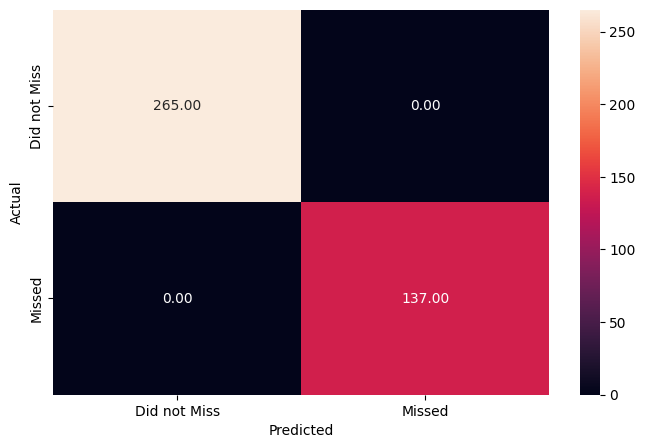

In [19]:
# Checking performance on the training dataset
y_train_pred_dt = dt.predict(x_train)

metrics_score(y_train, y_train_pred_dt)

              precision    recall  f1-score   support

         0.0       0.67      0.66      0.66       114
         1.0       0.36      0.37      0.37        59

    accuracy                           0.56       173
   macro avg       0.52      0.52      0.52       173
weighted avg       0.56      0.56      0.56       173



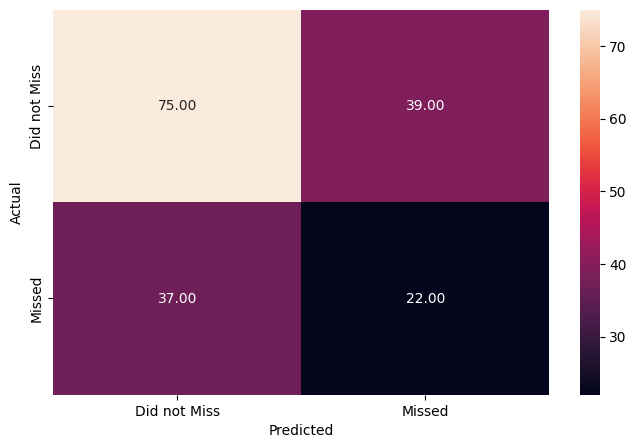

In [20]:
# Checking performance on the testing dataset
y_test_pred_dt = dt.predict(x_test)

metrics_score(y_test, y_test_pred_dt)

In [21]:
dtree_test = model_performance_classification(dt,x_test,y_test)
dtree_test

,Precision,Recall,Accuracy
0,0.515149,0.515388,0.560694


**plot the feature importance and check the most important features.**

[Text(0.8748553240740741, 0.9782608695652174, 'Q10bin_1.0 <= 0.5\ngini = 0.377\nsamples = 402\nvalue = [174.9, 58.91]\nclass = Missed'),
 Text(0.7793402777777778, 0.9347826086956522, 'Q44_2 <= 0.5\ngini = 0.362\nsamples = 390\nvalue = [174.24, 54.18]\nclass = Missed'),
 Text(0.6327546296296296, 0.8913043478260869, 'Q59bin <= 0.5\ngini = 0.348\nsamples = 377\nvalue = [172.26, 49.88]\nclass = Missed'),
 Text(0.4525462962962963, 0.8478260869565217, 'Q2 <= 6.5\ngini = 0.305\nsamples = 290\nvalue = [141.24, 32.68]\nclass = Missed'),
 Text(0.36435185185185187, 0.8043478260869565, 'ppmarit_5.0 <= 0.5\ngini = 0.276\nsamples = 262\nvalue = [132.66, 26.23]\nclass = Missed'),
 Text(0.2916666666666667, 0.7608695652173914, 'PPWORKA_8.0 <= 0.5\ngini = 0.227\nsamples = 203\nvalue = [108.9, 16.34]\nclass = Missed'),
 Text(0.2351851851851852, 0.717391304347826, 'Q16_4 <= 0.5\ngini = 0.218\nsamples = 201\nvalue = [108.9, 15.48]\nclass = Missed'),
 Text(0.16666666666666666, 0.6739130434782609, 'Q19 <= 3.

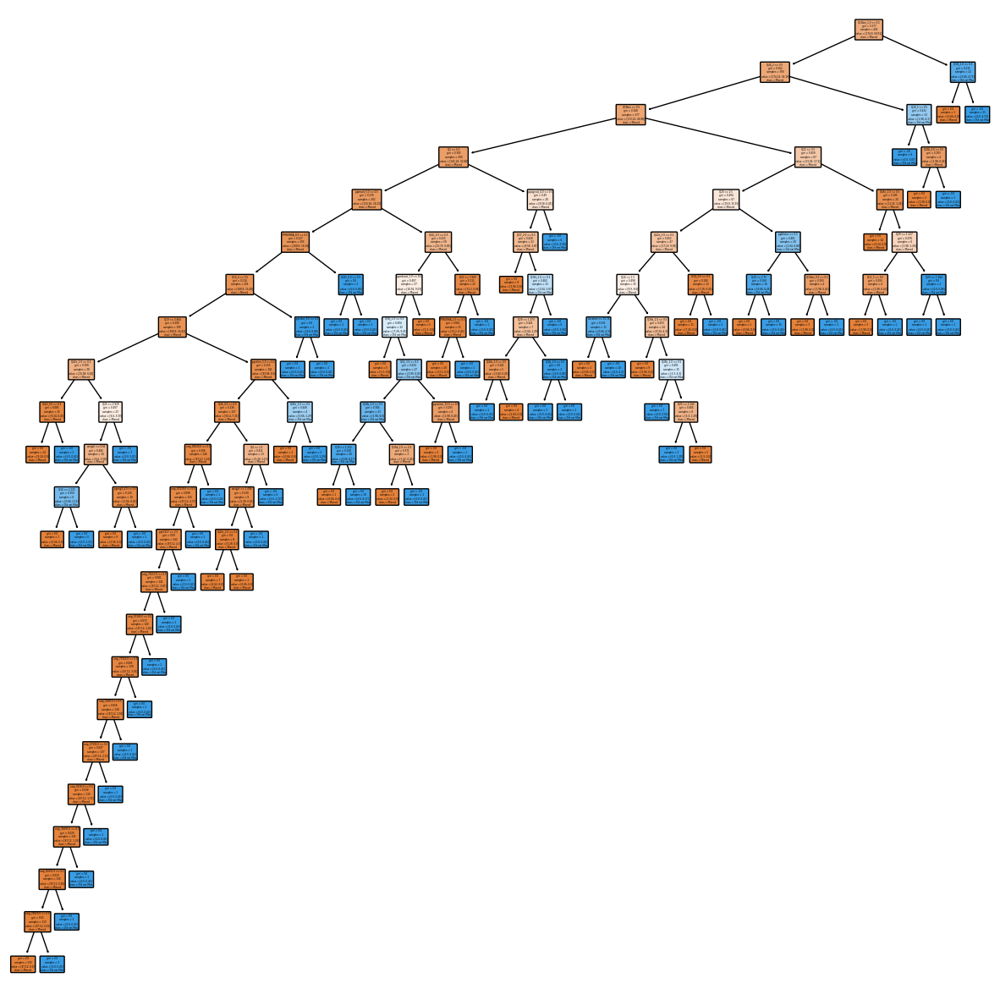

In [22]:
#plot the tree
plt.figure(figsize = (15, 15))
plot_tree(dt, filled = True, rounded = True, class_names = ['Missed', 'Did not Miss'], feature_names = X_encoded.columns)

In [23]:
# feature importance
sorted_idx = np.argsort(dt.feature_importances_)[::-1]
for index in sorted_idx:
    print([x_train.columns[index], dt.feature_importances_[index]])

['Q10bin_1.0', 0.048999036516894606]
['Q25', 0.047634675297022214]
['Q38j_1.0', 0.04199966991377289]
['Q22', 0.033521687931810644]
['weight', 0.03055705252379153]
['Q42i_2.0', 0.029687091967609408]
['Q44_2', 0.029347674570441865]
['Q4', 0.025648124884105793]
['Q37_2.0', 0.02490819658625558]
['Q24', 0.024861290445436515]
['Q59bin', 0.02440947401812493]
['Q38a_1.0', 0.024220067501697876]
['ppagecat_4.0', 0.023032983650811058]
['Q26_5', 0.022748298004717282]
['Q20', 0.02262678771604477]
['Q2', 0.021726615006240558]
['pphhsize', 0.021691560337360874]
['Q45h_2.0', 0.021323198371856703]
['Q42e_1.0', 0.020983870067266347]
['Q29', 0.020981936278110853]
['Q42h_3.0', 0.020614992797759885]
['ppeducat_1.0', 0.019134546334219397]
['Q62_3.0', 0.017928620807006742]
['ppmarit_5.0', 0.01607769893797199]
['Q38h_1.0', 0.015949176731124625]
['Q40b_1.0', 0.015304814145536787]
['Q16_4', 0.015064357894508867]
['ppethm_5.0', 0.015017432591861052]
['Q19', 0.014861843403514652]
['PPWORKA_8.0', 0.014857469555489

### **Cost Complexity Pruning**   

**Part 1: Visualize alpha**
**Alpha** controls how much pruning happens. To finde the optimal value for **alpha**, we will plot the accuracy of the tree as a function of different values for both traning and testing datasets. 

In [24]:
# determine values for alpha
#This feature was introduced in sklearn 0.22. Please upgrade sklearn before running this cell
# to upgrade sklearn, run the following code: pip upgrade scikit-learn
path= dt.cost_complexity_pruning_path(x_train, y_train)
#extract different values for alpha
ccp_alphas = path.ccp_alphas
#exclude the max value for alpha
ccp_alphas = ccp_alphas[:-1]

# create an empty list to store decision tree into
dts= []

#loop through different values of alpha
for ccp_alpha in ccp_alphas:
    dt= DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    dt.fit(x_train, y_train)
    dts.append(dt)


**Graph the accuracy of the tree using the traning and testing datasets as a function of alpha**

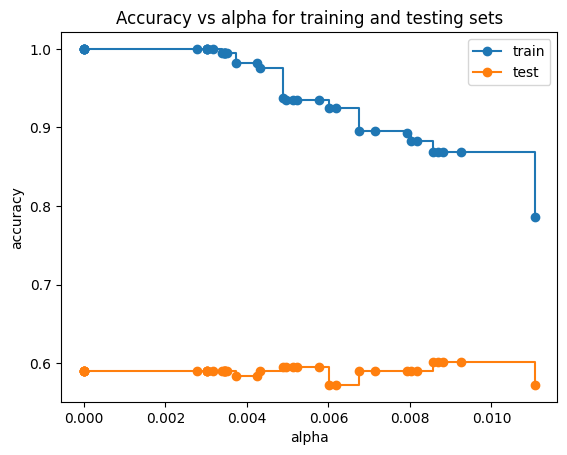

In [25]:
train_scores= [dt.score(x_train, y_train) for dt in dts]
test_scores= [dt.score(x_test, y_test) for dt in dts]

fig, ax= plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker= 'o', label= "train", drawstyle= "steps-post")
ax.plot(ccp_alphas, test_scores, marker= 'o', label= "test", drawstyle= "steps-post")
ax.legend()
plt.show()

**Observations** the accuracy for the testing dataset stays at 94% unitl alpha reaches around 0.0035. Then accuracy increases. 

**Part 2: Cross Validation for finding the best alpha**


<Axes: xlabel='alpha'>

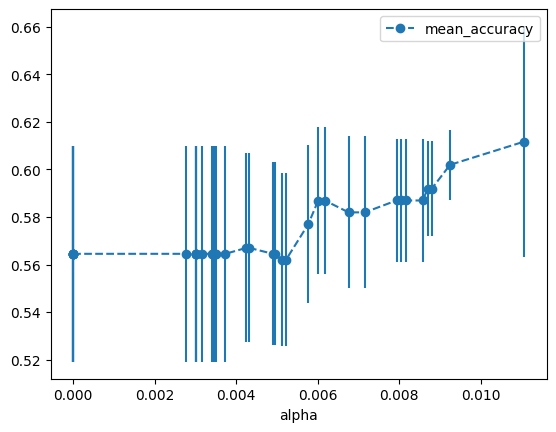

In [26]:
# create an array to store the results of each fold of cross validation
alpha_loop_values= []

# for each candidate value for alpha, we will run 5-fold cross validation
# then we will store the mean and standard deviation of the accuracy scores for each fold
for ccp_alpha in ccp_alphas:
    dt= DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
    scores= cross_val_score(dt, x_train, y_train, cv=5)
    alpha_loop_values.append([ccp_alpha, np.mean(scores), np.std(scores)])

# draw a graph of the results (means and standard deviations) of the cross validation
alpha_results= pd.DataFrame(alpha_loop_values, columns= ['alpha', 'mean_accuracy', 'std'])

alpha_results.plot(x= 'alpha', y= 'mean_accuracy', yerr= 'std', marker= 'o', linestyle= '--')

In [27]:
# extract the best value for alpha
alpha_results[(alpha_results['alpha'] > 0.008) & (alpha_results['alpha'] < 0.02)]

,alpha,mean_accuracy,std
32,0.008038,0.586944,0.025989
33,0.008177,0.586944,0.025989
34,0.008575,0.586944,0.025989
35,0.008700,0.591944,0.020149
36,0.008800,0.591944,0.020149
37,0.009246,0.601944,0.014734
38,0.011063,0.611698,0.048687


In [28]:
# putting the best value for alpha into a variable
#ideal_ccp_alpha =alpha_results[(alpha_results['alpha'] > 0.006) & (alpha_results['alpha'] < 0.010)]['alpha']

# convert the ideal_ccp_alpha series into a float
#ideal_ccp_alpha = float(ideal_ccp_alpha)

ideal_ccp_alpha= 0.011063


## **Building, Evaluating, and Drawing the Final Classificaiton Tree**

Now we will use the ideal value for **alpha** to build the final classification tree

In [29]:
# build a decision tree using the ideal value for alpha
dt_pruned= DecisionTreeClassifier(random_state=42, ccp_alpha=ideal_ccp_alpha)
dt_pruned= dt_pruned.fit(x_train, y_train)

              precision    recall  f1-score   support

         0.0       0.83      0.85      0.84       265
         1.0       0.69      0.66      0.68       137

    accuracy                           0.79       402
   macro avg       0.76      0.76      0.76       402
weighted avg       0.78      0.79      0.78       402



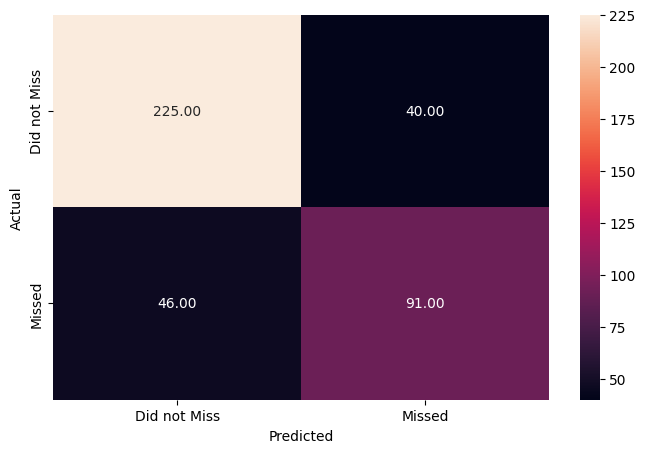

In [30]:
# Checking performance on the training dataset
y_train_pred_dt_pruned = dt_pruned.predict(x_train)

metrics_score(y_train, y_train_pred_dt_pruned)

In [33]:
dtree_train = model_performance_classification(dt_pruned,x_train,y_train)
dtree_train

,Precision,Recall,Accuracy
0,0.762457,0.756645,0.78607


              precision    recall  f1-score   support

         0.0       0.69      0.65      0.67       114
         1.0       0.38      0.42      0.40        59

    accuracy                           0.57       173
   macro avg       0.53      0.54      0.53       173
weighted avg       0.58      0.57      0.58       173



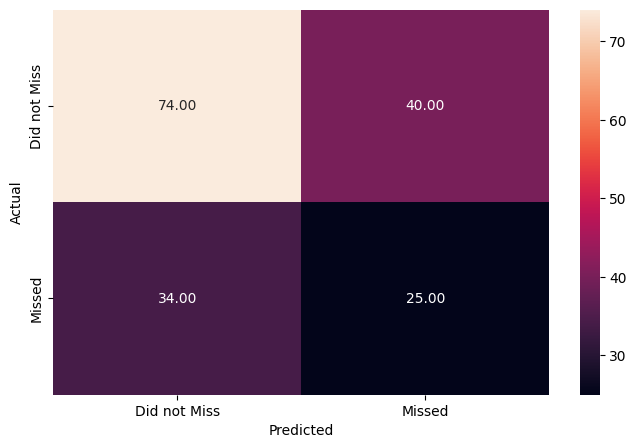

In [31]:
# Checking performance on the testing dataset
y_test_pred_dt_pruned = dt_pruned.predict(x_test)

metrics_score(y_test, y_test_pred_dt_pruned)

In [34]:
dtree_test = model_performance_classification(dt_pruned,x_test,y_test)
dtree_test

,Precision,Recall,Accuracy
0,0.5349,0.536426,0.572254


**Drawing the pruned tree**

[Text(0.625, 0.9285714285714286, 'Q10bin_1.0 <= 0.5\ngini = 0.449\nsamples = 402\nvalue = [265, 137]\nclass = Missed'),
 Text(0.5416666666666666, 0.7857142857142857, 'Q59bin <= 0.5\ngini = 0.437\nsamples = 390\nvalue = [264, 126]\nclass = Missed'),
 Text(0.3333333333333333, 0.6428571428571429, 'Q44_2 <= 0.5\ngini = 0.4\nsamples = 297\nvalue = [215, 82]\nclass = Missed'),
 Text(0.25, 0.5, 'Q2 <= 6.5\ngini = 0.387\nsamples = 290\nvalue = [214, 76]\nclass = Missed'),
 Text(0.16666666666666666, 0.35714285714285715, 'ppmarit_5.0 <= 0.5\ngini = 0.357\nsamples = 262\nvalue = [201, 61]\nclass = Missed'),
 Text(0.08333333333333333, 0.21428571428571427, 'gini = 0.304\nsamples = 203\nvalue = [165, 38]\nclass = Missed'),
 Text(0.25, 0.21428571428571427, 'Q42i_2.0 <= 0.5\ngini = 0.476\nsamples = 59\nvalue = [36, 23]\nclass = Missed'),
 Text(0.16666666666666666, 0.07142857142857142, 'gini = 0.491\nsamples = 37\nvalue = [16, 21]\nclass = Did not Miss'),
 Text(0.3333333333333333, 0.07142857142857142, 

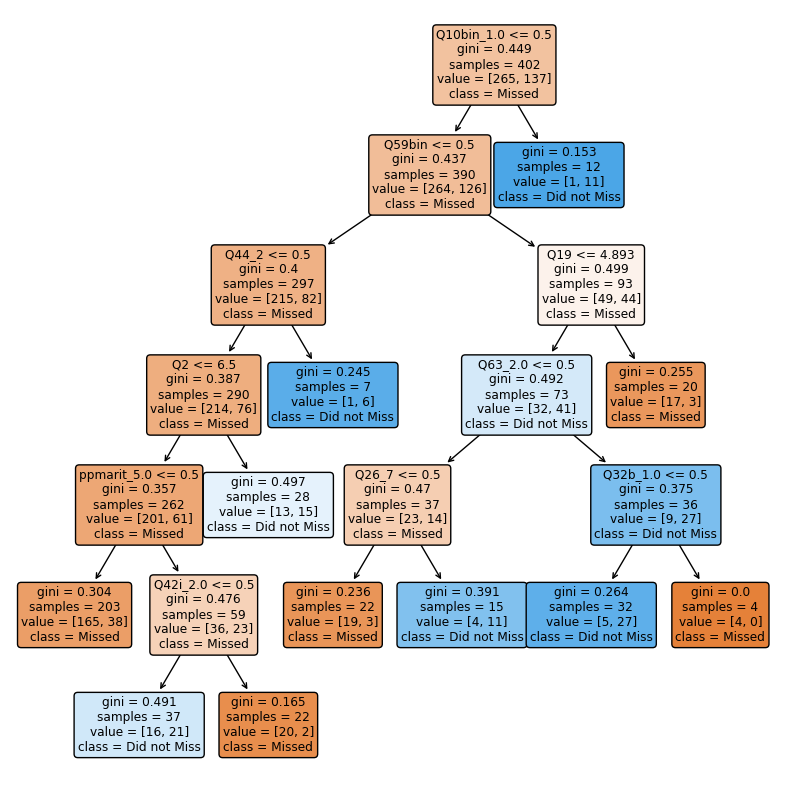

In [35]:
#plot the tree
plt.figure(figsize = (10,10))
plot_tree(dt_pruned, filled = True, rounded = True, class_names = ['Missed', 'Did not Miss'], feature_names = X_encoded.columns)    